# Projet NLP


*   Mustapha SI KADDOUR



In [ ]:
!pip install datasets evaluate accelerate -U shap stop-words

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 507.1/507.1 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 270.9/270.9 kB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 533.5/533.5 kB 13.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 9.8 MB/s eta 0:00:00
  Created wheel for stop-words: filename=stop_words-2018.7.23-py3-none-any.whl size=32895 sha256=61e1e27e9b1cc4e0a317ffcf5a960a799808ae24c4fd5dcfb20bf27786ce5c51
  Stored in directory: /root/.cache/pip/wheels/d0/1a/23/f12552a50cb09bcc1694a5ebb6c2cd5f2a0311de2b8c3d9a89
Successfully built stop-words


In [ ]:
import plotly
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import evaluate
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from imblearn.over_sampling import SMOTE
import nltk
import re
from nltk.tokenize import word_tokenize
import gensim
from gensim.utils import simple_preprocess
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import CountVectorizer
import plotly.express as px
from transformers import Trainer
from transformers import AutoModelForSequenceClassification
from transformers import TrainingArguments
from transformers import AutoTokenizer
import torch
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import shap
import torch
import scipy as sp
from wordcloud import WordCloud
from datasets import load_dataset

In [ ]:

## Dataset: https://huggingface.co/datasets/financial_phrasebank
dataset = load_dataset('financial_phrasebank', 'sentences_allagree')


The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.


Generating train split:   0%|          | 0/2264 [00:00<?, ? examples/s]

# PART I : TF-IDF, BoW, Word2Vec

## Exploratory Data Analysis (EDA)
La phase d'analyse exploratoire des données vise à approfondir notre compréhension des données en utilisant des graphiques, des fonctions spécifiques et des traitements adaptés pour obtenir des informations approfondies. Cette démarche nous permet de déterminer les prétraitements nécessaires afin de mieux préparer les données pour des analyses ultérieures.

Afficher les premieres lignes du DS :
le data set se compose de trois colonnes, la première c'est des textes d'informations financieres la deuxieme c'est des labels qui disent si le texte est positive, négative ou neutre (sentiment analysis)

In [ ]:
tmp_df = dataset['train'].to_pandas()
tmp_df.head()

,sentence,label
0,"According to Gran , the company has no plans t...",1
1,"For the last quarter of 2010 , Componenta 's n...",2
2,"In the third quarter of 2010 , net sales incre...",2
3,Operating profit rose to EUR 13.1 mn from EUR ...,2
4,"Operating profit totalled EUR 21.1 mn , up fro...",2


In [ ]:
tmp_df['label'].unique()

array([1, 2, 0])

Comme on le voit dans la cellule suivante, y'a pas de valeur manquante

In [ ]:
# Check for missing values
print("\nMissing values:")
print(tmp_df.isnull().sum())

# Summary statistics for the 'label' column
print("\nLabel distribution:")
print(tmp_df['label'].value_counts())






Missing values:
sentence    0
label       0
dtype: int64

Label distribution:
1    1391
2     570
0     303
Name: label, dtype: int64


En utilisant un nuage de données textuelles, nous pouvons voir les mots qui sont les plus fréquents dans l'ensemble de notre dataset

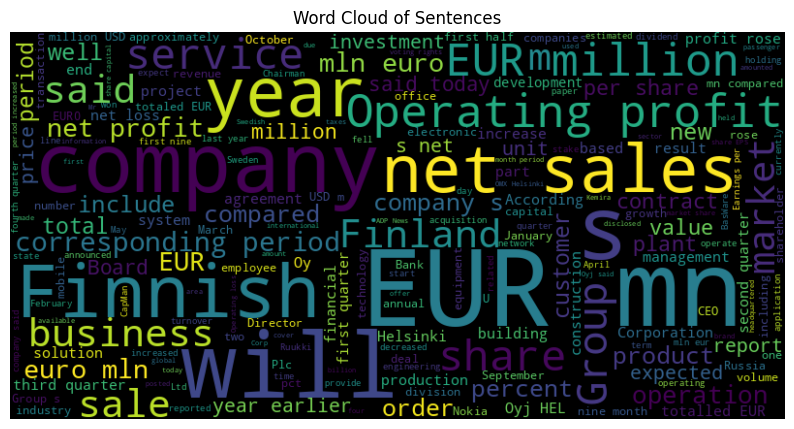

In [ ]:
# Create a Word Cloud to visualize common words in sentences
text = ' '.join(tmp_df['sentence'].astype(str).tolist())
wordcloud = WordCloud(width=800, height=400, random_state=21, max_font_size=110).generate(text)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Word Cloud of Sentences')
plt.show()

Nous pouvons visualsier la distribution des classes (Positive,Neutre et negative), comme on le constate la distribution n'est pas équitable et ca nous fait donc penser a faire en sorte d'équlibrer les classes dans les prochaines étapes

In [ ]:
tpf = tmp_df
# Map numerical labels to sentiment labels
sentiment_mapping = {0: 'Negative', 1: 'Neutral', 2: 'Positive'}
tpf['sentiment'] = tpf['label'].map(sentiment_mapping)

# Create a pie chart using Plotly Express
fig = px.pie(tpf, names='sentiment', title='Distribution of Sentiments', hole=0.4,
             color_discrete_sequence=px.colors.qualitative.Set3)

# Customize the layout
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(legend=dict(title='Sentiments'))

# Show the pie chart
fig.show()


In [ ]:
tmp_df['length_text'] = tmp_df['sentence'].apply(lambda x: len(str(x)))

Nous pouvons également afficher des boites à moustaches pour chaque classes et le conte et nombre de mots par text afin d'avoir plus d'informations statistique concernant celle ci

In [ ]:
fig = px.box(tmp_df, x = 'label', y = 'length_text')
fig

In [ ]:
fig = px.histogram(tmp_df, x='length_text', template='plotly_white', title='Text counts by length')
fig.update_xaxes(categoryorder='total descending', title='Number of words')
fig.show()

**bold text**## Preprocessing & Data Cleaning
Après avoir acquis une comp:réhension approfondie des données ainsi que de leur distribution, nous pouvons désormais aborder la phase de prétraitement.

In [ ]:
df = tmp_df
import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True


Comme vu précédemment, chaque texte contient des stopwords qui nécessitent d'être supprimés. De plus, nous envisageons également de normaliser le texte en convertissant toutes les lettres en minuscules, en supprimant les virgules, et enfin, en effectuant une lemmatisation sur les textes afin de standardiser et simplifier le traitement des textes, améliorant ainsi la cohérence des données et facilitant l'analyse ultérieure.

In [ ]:
# Tokenization and removing stop words
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def preprocess_text(text):
    text = str(text).lower()
    text = re.sub('[^a-zA-Z0-9.]', ' ', text)
    text = re.sub('( ){2,}',' ', text)
    tokens = word_tokenize(text)
    tokens = [lemmatizer.lemmatize(word) for word in tokens if word not in stop_words]
    cleaned_text = " ".join(tokens)
    return cleaned_text

df["processed_sentence"] = df["sentence"].apply(preprocess_text)

df

,sentence,label,sentiment,length_text,processed_sentence
0,"According to Gran , the company has no plans t...",1,Neutral,127,according gran company plan move production ru...
1,"For the last quarter of 2010 , Componenta 's n...",2,Positive,193,last quarter 2010 componenta net sale doubled ...
2,"In the third quarter of 2010 , net sales incre...",2,Positive,125,third quarter 2010 net sale increased 5.2 eur ...
3,Operating profit rose to EUR 13.1 mn from EUR ...,2,Positive,122,operating profit rose eur 13.1 mn eur 8.7 mn c...
4,"Operating profit totalled EUR 21.1 mn , up fro...",2,Positive,103,operating profit totalled eur 21.1 mn eur 18.6...
...,...,...,...,...,...
2259,Operating result for the 12-month period decre...,0,Negative,143,operating result 12 month period decreased pro...
2260,HELSINKI Thomson Financial - Shares in Cargote...,0,Negative,248,helsinki thomson financial share cargotec fell...
2261,LONDON MarketWatch -- Share prices ended lower...,0,Negative,144,london marketwatch share price ended lower lon...
2262,Operating profit fell to EUR 35.4 mn from EUR ...,0,Negative,108,operating profit fell eur 35.4 mn eur 68.8 mn ...


In [ ]:
# Feature and Target
X = np.array(df["processed_sentence"])
y = np.array(df["label"])

#Bigram
Essaions maintenant d'afficher les bigrams afin de voir si ca vaut le coup d'utiliser un modèle Ngram ou pas

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd

text = df['processed_sentence']
model = CountVectorizer(ngram_range = (1, 1), stop_words='english')
matrix = model.fit_transform(text).toarray()
df_output = pd.DataFrame(data = matrix, columns = model.get_feature_names_out())
df_output.T.tail(5)

,0,1,2,3,4,5,6,7,8,9,...,2254,2255,2256,2257,2258,2259,2260,2261,2262,2263
zgody,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
zinc,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
zoltan,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
zone,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
zu,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
def get_ngrams(text, ngram_from=2, ngram_to=2, n=None, max_features=20000):

    vec = CountVectorizer(ngram_range = (ngram_from, ngram_to),
                          max_features = max_features,
                          stop_words='english').fit(text)
    bag_of_words = vec.transform(text)
    sum_words = bag_of_words.sum(axis = 0)
    words_freq = [(word, sum_words[0, i]) for word, i in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse = True)

    return words_freq[:n]

In [ ]:
bigrams = get_ngrams(df['processed_sentence'], ngram_from=2, ngram_to=2, n=150)
bigrams_df = pd.DataFrame(bigrams)
bigrams_df.columns=["Bigram", "Frequency"]
bigrams_df.head()

,Bigram,Frequency
0,eur mn,165
1,net sale,147
2,operating profit,146
3,mn eur,119
4,corresponding period,91


In [ ]:
px.bar(bigrams_df, x = 'Bigram', y = 'Frequency')

Comme nous pouvons le voir y'a plusieurs couple de mots qui sont fréquents ensemble, il serait donc intéressons d'essayer un modèle à 2gram

## TF-IDF
Passons maintenant au prétraitement (vectorisation) des données textuelle en utilisant le modèle TF-IDF, nous avons utilsier SMOTE pour équilibrer les classes

In [ ]:
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Address Class Imbalance using SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

In [ ]:
X_train.shape

(1811, 5479)

In [ ]:
X_resampled.shape

(3345, 5479)

Et maintenant entrainons deux modèles ML pour voir les performances après avoir appliquer ce prétraitement

In [ ]:
# Model Training - SGDClassifier
classifier_sgd = SGDClassifier()
classifier_sgd.fit(X_resampled, y_resampled)

# Model Training - Random Forest
classifier_rf = RandomForestClassifier(n_estimators=100, random_state=42)
classifier_rf.fit(X_resampled, y_resampled)

RandomForestClassifier(random_state=42)

In [ ]:
# Make predictions
y_pred_sgd = classifier_sgd.predict(X_test)
y_pred_rf = classifier_rf.predict(X_test)

# Evaluate the models
acc_sgd = accuracy_score(y_test, y_pred_sgd)
acc_rf = accuracy_score(y_test, y_pred_rf)
print("\nSGDClassifier Performance:")
print("Accuracy:", accuracy_score(y_test, y_pred_sgd))
print("Classification Report:\n", classification_report(y_test, y_pred_sgd))

print("\nRandom Forest Performance:")
print("Accuracy:", accuracy_score(y_test, y_pred_rf))
print("Classification Report:\n", classification_report(y_test, y_pred_rf))


SGDClassifier Performance:
Accuracy: 0.847682119205298
Classification Report:
               precision    recall  f1-score   support

           0       0.66      0.77      0.71        56
           1       0.89      0.95      0.92       276
           2       0.84      0.65      0.73       121

    accuracy                           0.85       453
   macro avg       0.80      0.79      0.79       453
weighted avg       0.85      0.85      0.84       453


Random Forest Performance:
Accuracy: 0.8520971302428256
Classification Report:
               precision    recall  f1-score   support

           0       0.73      0.68      0.70        56
           1       0.88      0.97      0.92       276
           2       0.83      0.66      0.74       121

    accuracy                           0.85       453
   macro avg       0.81      0.77      0.79       453
weighted avg       0.85      0.85      0.85       453



les deux modèles ont donnée presque les memes performances



```
# This is formatted as code
```

## TFIDF using Ngram
Essayons maintenant la meme méthode en utilisant Ngram

In [ ]:
# tf idf with ngram range
# Feature and Target
X_1 = np.array(df["processed_sentence"])
y_1 = np.array(df["label"])
vectorizer2 = TfidfVectorizer(ngram_range=(1,4))
X_1 = vectorizer.fit_transform(X_1)
X_train1, X_test1, y_train1, y_test1 = train_test_split(X_1, y_1, test_size=0.2, random_state=42)
# Address Class Imbalance using SMOTE
smote = SMOTE(random_state=42)
X_resampled1, y_resampled1 = smote.fit_resample(X_train1, y_train1)

In [ ]:
# Model Training - SGDClassifier
classifier_sgd1 = SGDClassifier()
classifier_sgd1.fit(X_resampled1, y_resampled1)

# Model Training - Random Forest
classifier_rf1 = RandomForestClassifier(n_estimators=100, random_state=42)
classifier_rf1.fit(X_resampled1, y_resampled1)

# Make predictions
y_pred_sgd1 = classifier_sgd1.predict(X_test1)
y_pred_rf1 = classifier_rf1.predict(X_test1)

# Evaluate the models
acc_sgd1 = accuracy_score(y_test1, y_pred_sgd1)
acc_rf1 = accuracy_score(y_test1, y_pred_rf1)
print("\nSGDClassifier Performance:")
print("Accuracy:", accuracy_score(y_test1, y_pred_sgd1))


print("\nRandom Forest Performance:")
print("Accuracy:", accuracy_score(y_test1, y_pred_rf1))



SGDClassifier Performance:
Accuracy: 0.7262693156732892

Random Forest Performance:
Accuracy: 0.6688741721854304


Les performances se sont  dégradé et donc nous pouvons assumer que l'utilisation de Ngram n'est pas avantagieuse dans ce cas là

##Bag Of words (BoW)
Passons maintenant à la méthode de véctorisation BoW

In [ ]:
# Feature and Target
X = np.array(df["processed_sentence"])
y = np.array(df["label"])
vectorizer = CountVectorizer()
# Transform the text data
X_bow = vectorizer.fit_transform(X)

In [ ]:
# Split the data into training and testing sets
X_train_bow, X_test_bow, y_train_bow, y_test_bow = train_test_split(X_bow, y, test_size=0.2, random_state=42)

# Address Class Imbalance using SMOTE
smote = SMOTE(random_state=42)
X_resampled_bow, y_resampled_bow = smote.fit_resample(X_train_bow, y_train_bow)



# Model Training - SGDClassifier
classifier_sgd_bow = SGDClassifier()
classifier_sgd_bow.fit(X_resampled_bow, y_resampled_bow)

# Model Training - Random Forest
classifier_rf_bow = RandomForestClassifier(n_estimators=100, random_state=42)
classifier_rf_bow.fit(X_resampled_bow, y_resampled_bow)



# Make predictions
y_pred_sgd_bow = classifier_sgd_bow.predict(X_test_bow)
y_pred_rf_bow = classifier_rf_bow.predict(X_test_bow)

acc_sgd_bow = accuracy_score(y_test_bow, y_pred_sgd_bow)
acc_rf_bow = accuracy_score(y_test_bow, y_pred_rf_bow)


print("\nSGDClassifier Performance:")
print("Accuracy:", accuracy_score(y_test_bow, y_pred_sgd_bow))


print("\nRandom Forest Performance:")
print("Accuracy:", accuracy_score(y_test_bow, y_pred_rf_bow))



SGDClassifier Performance:
Accuracy: 0.7152317880794702

Random Forest Performance:
Accuracy: 0.6688741721854304



La méthode Bag-of-Words (BoW) a affiché des performances inférieures à la méthode TF-IDF. Cette différence s'explique par le fait que BoW ne tient compte que de la fréquence d'occurrence des mots, sans considérer leur importance relative dans l'ensemble du corpus, contrairement à TF-IDF. TF-IDF, en attribuant des poids plus élevés aux mots rares mais informatifs, peut mieux capturer la pertinence des termes pour la tâche à accomplir. Le choix entre BoW et TF-IDF dépend de la nature spécifique du corpus et des objectifs de la tâche d'analyse textuelle.

*italicized text*## Word2Vec

In [ ]:
from gensim.models import Word2Vec
X_2 = np.array(df["processed_sentence"])
tokenized_sentences = [nltk.word_tokenize(sentence) for sentence in X_2]
# Train Word2Vec model
word2vec_model = Word2Vec(sentences=tokenized_sentences, vector_size=100, window=5, min_count=1, workers=4)

# Function to average word vectors for a document
def average_word_vectors(words, model, vocabulary, num_features):
    feature_vector = np.zeros((num_features,), dtype="float64")
    nwords = 0.

    for word in words:
        if word in vocabulary:
            nwords = nwords + 1.
            feature_vector = np.add(feature_vector, model.wv[word])

    if nwords:
        feature_vector = np.divide(feature_vector, nwords)

    return feature_vector

# Transform the text data into word vectors
X_word2vec = [average_word_vectors(words, word2vec_model, word2vec_model.wv.index_to_key, 100) for words in tokenized_sentences]

# Split the data into training and testing sets
X_train_wv, X_test_wv, y_train_wv, y_test_wv = train_test_split(X_word2vec, y, test_size=0.2, random_state=42)

# Address Class Imbalance using SMOTE
smote = SMOTE(random_state=42)
X_resampled_wv, y_resampled_wv = smote.fit_resample(X_train_wv, y_train_wv)


# Model Training - SGDClassifier
classifier_sgd_wv = SGDClassifier()
classifier_sgd_wv.fit(X_resampled_wv, y_resampled_wv)

# Model Training - Random Forest
classifier_rf_wv = RandomForestClassifier(n_estimators=100, random_state=42)
classifier_rf_wv.fit(X_resampled_wv, y_resampled_wv)


# Make predictions

y_pred_sgd_wv = classifier_sgd_wv.predict(X_test_wv)
y_pred_rf_wv = classifier_rf_wv.predict(X_test_wv)

acc_sgd_wv = accuracy_score(y_test, y_pred_sgd_wv)
acc_rf_wv = accuracy_score(y_test, y_pred_rf_wv)

print("\nSGDClassifier Performance:")
print("Accuracy:", accuracy_score(y_test_wv, y_pred_sgd_wv))


print("\nRandom Forest Performance:")
print("Accuracy:", accuracy_score(y_test_wv, y_pred_rf_wv))




SGDClassifier Performance:
Accuracy: 0.6534216335540839

Random Forest Performance:
Accuracy: 0.6799116997792495


Word2Vec a montré des performances inférieures à TF-IDF. Cette disparité peut être due à la capacité limitée de Word2Vec à capturer des nuances sémantiques, particulièrement dans des corpus de petite taille ou manquant de diversité sémantique. TF-IDF, en se basant sur la fréquence d'occurrence relative, peut surperformer dans des situations où la sémantique fine des mots n'est pas aussi cruciale. Le choix entre ces méthodes doit être fait en fonction des caractéristiques spécifiques du corpus et des exigences de la tâche d'analyse textuelle.

In [ ]:
word2vec_model.wv.most_similar('company',topn = 5)

[('finnish', 0.9997761249542236),
 ('service', 0.9997718930244446),
 ('business', 0.9997680187225342),
 ('group', 0.9997639060020447),
 ('finland', 0.9997490048408508)]

Word2Vec peut nous donner des scores de similarities pour chaque mots dans le dataset, comme pour le mot company ci dessus



##Topic Modelling



First, let's get a visual representation of most common words. It is key to understanding the data and ensuring we are on the right track, and if any more preprocessing is necessary before training the model.!

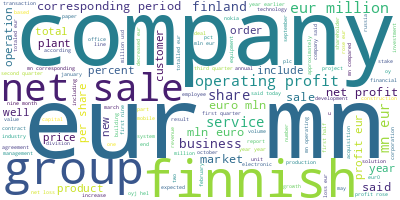

In [ ]:
# Import the wordcloud library
from wordcloud import WordCloud
# Join the different processed titles together.
long_string = ','.join(list(df['processed_sentence'].values))
# Create a WordCloud object
wordcloud = WordCloud(background_color="white", max_words=5000, contour_width=3, contour_color='steelblue')
# Generate a word cloud
wordcloud.generate(long_string)
# Visualize the word cloud
wordcloud.to_image()

###LDA model training


In [ ]:
import re

def clean_text(x):
  x = x.lower()
  x = re.sub('[^a-zA-Z0-9.]', ' ', x)
  x = re.sub('( ){2,}',' ', x)
  return x

tmp_df['cleaned_text'] = tmp_df['sentence'].apply(clean_text)

In [ ]:
import os
import pandas as pd
from nltk.tokenize import RegexpTokenizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation

# Initialize regex tokenizer
tokenizer = RegexpTokenizer(r'\w+')

# Vectorize document using TF-IDF
tfidf = TfidfVectorizer(lowercase=True,
                        stop_words='english',
                        ngram_range = (1,1), min_df = 0.1,
                        tokenizer = tokenizer.tokenize)

# Fit and Transform the documents
train_data = tfidf.fit_transform(tmp_df['cleaned_text'].tolist())

# Define the number of topics or components
num_components=5
# Create LDA object
model=LatentDirichletAllocation(n_components=num_components)
# Fit and Transform SVD model on data
lda_matrix = model.fit_transform(train_data)
# Get Components
lda_components=model.components_

/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



In [ ]:
# Print the topics with their terms
terms = tfidf.get_feature_names_out()
for index, component in enumerate(lda_components):
    zipped = zip(terms, component)
    top_terms_key=sorted(zipped, key = lambda t: t[1], reverse=True)[:7]
    top_terms_list=list(dict(top_terms_key).keys())
    print("Topic "+str(index)+": ",top_terms_list)

Topic 0:  ['sales', 'net', 's', 'eur', 'company', 'mn', 'profit']
Topic 1:  ['1', 'profit', 'eur', 's', 'net', 'company', 'mn']
Topic 2:  ['eur', 'mn', 'profit', 'net', '1', 's', 'sales']
Topic 3:  ['profit', 'net', 'company', 's', '1', 'eur', 'sales']
Topic 4:  ['s', 'company', 'eur', 'net', 'profit', 'sales', '1']


Number of unique tokens: 551
Number of documents: 2264
[[(0, 1), (1, 1), (2, 2), (3, 1), (4, 2), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1)]]
[(0, '0.141*"as" + 0.055*"services" + 0.037*"well" + 0.030*"products" + 0.028*"corporation" + 0.026*"business" + 0.023*"electronics" + 0.023*"industry" + 0.023*"group" + 0.022*"oy"'), (1, '0.060*"by" + 0.033*"million" + 0.031*"percent" + 0.029*"has" + 0.023*"building" + 0.022*"finland" + 0.021*"us" + 0.020*"production" + 0.020*"area" + 0.018*"about"'), (2, '0.233*"is" + 0.068*"are" + 0.052*"finland" + 0.032*"which" + 0.028*"based" + 0.027*"be" + 0.025*"by" + 0.024*"operations" + 0.023*"some" + 0.022*"expected"'), (3, '0.088*"its" + 0.072*"company" + 0.054*"that" + 0.050*"said" + 0.047*"it" + 0.032*"has" + 0.031*"an" + 0.022*"according" + 0.020*"with" + 0.020*"board"'), (4, '0.105*"mln" + 0.066*"euro" + 0.066*"finnish" + 0.054*"oyj" + 0.046*"said" + 0.039*"its" + 0.037*"net" + 0.028*"today" + 0.024*"hel" + 0.023*"same"'), (5, '0.078*"than" + 0.057*"we

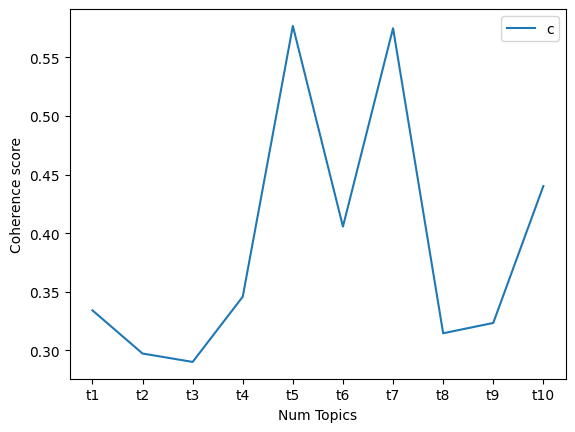

In [ ]:
from gensim.corpora.dictionary import Dictionary
import gensim
from gensim.models import Phrases

#Remove rare & common tokens
# Create a dictionary representation of the documents.
from gensim.utils import simple_preprocess

def sent_to_words(sentences):
    for sentence in sentences:
        # deacc=True removes punctuations
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

docs = list(sent_to_words(df['cleaned_text'].tolist()))


bigram = Phrases(docs, min_count=10)
trigram = Phrases(bigram[docs])

dictionary = Dictionary(docs)
dictionary.filter_extremes(no_below=10, no_above=0.2)
#Create dictionary and corpus required for Topic Modeling
corpus = [dictionary.doc2bow(doc) for doc in docs]
print('Number of unique tokens: %d' % len(dictionary))
print('Number of documents: %d' % len(corpus))
print(corpus[:1])

from gensim.models.ldamodel import LdaModel
from gensim.models.coherencemodel import CoherenceModel
# Set parameters.
num_topics = 10
chunksize = 500
passes = 20
iterations = 400
eval_every = 1

# Make a index to word dictionary.
temp = dictionary[0]  # only to "load" the dictionary.
id2word = dictionary.id2token

lda_model = LdaModel(corpus=corpus, id2word=id2word, chunksize=chunksize, \
                       alpha='auto', eta='auto', \
                       iterations=iterations, num_topics=num_topics, \
                       passes=passes, eval_every=eval_every)
# Print the Keyword in the 10 topics
print(lda_model.print_topics())

# Compute Coherence Score using c_v
coherence_model_lda = CoherenceModel(model=lda_model, texts=docs, dictionary=dictionary, coherence='c_v')
coherence_ldas = coherence_model_lda.get_coherence_per_topic()
print('\nCoherence Score: ', coherence_ldas)

import matplotlib.pyplot as plt
import numpy as np
topicsname=[]
for i in range(1,num_topics+1):
    topicsname.append("t{0}".format(i))
topicsname

plt.plot(topicsname,coherence_ldas)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()


## Fine-tune LMs for Sentiment Analysis (BERT, RoBERTa, DistilRoBERTa, FinBERT)
Passons à présent aux modèles Transformers. Nous sélectionnons quelques-uns d'entre eux et procédons à un ajustement fin (fine-tuning) pour la tâche d'analyse de sentiment financier. Nous comparerons les résultats afin de déterminer le modèle qui offre les meilleures performances.

 ### BERT

In [ ]:
dataset = load_dataset("financial_phrasebank", "sentences_allagree")
dataset["train"][0]


The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.


Generating train split:   0%|          | 0/2264 [00:00<?, ? examples/s]

{'sentence': 'According to Gran , the company has no plans to move all production to Russia , although that is where the company is growing .',
 'label': 1}

In [ ]:
len(dataset['train'])

2264

In [ ]:


tokenizer = AutoTokenizer.from_pretrained("bert-base-cased")


def tokenize_function(examples):
    return tokenizer(examples["sentence"], padding="max_length", truncation=True)


tokenized_datasets = dataset.map(tokenize_function, batched=True)

tokenizer_config.json:   0%|          | 0.00/29.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/213k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/436k [00:00<?, ?B/s]

Map:   0%|          | 0/2264 [00:00<?, ? examples/s]

In [ ]:
small_train_dataset = tokenized_datasets["train"].select(range(1812))
small_eval_dataset = tokenized_datasets["train"].select(range(1812,2264))

In [ ]:

model = AutoModelForSequenceClassification.from_pretrained("bert-base-cased", num_labels=3)

model.safetensors:   0%|          | 0.00/436M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-cased and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:

training_args = TrainingArguments(output_dir="test_trainer",evaluation_strategy="steps",
    num_train_epochs=3, )

In [ ]:
metric = evaluate.load("accuracy")

In [ ]:
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=-1)
    return metric.compute(predictions=predictions, references=labels)

In [ ]:

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=small_train_dataset,
    eval_dataset=small_eval_dataset,
    compute_metrics=compute_metrics,
)

In [ ]:
trainer.train()

Step,Training Loss,Validation Loss,Accuracy
500,0.181700,0.841374,0.851770


TrainOutput(global_step=681, training_loss=0.13683346259611467, metrics={'train_runtime': 499.7884, 'train_samples_per_second': 10.877, 'train_steps_per_second': 1.363, 'total_flos': 1430284538769408.0, 'train_loss': 0.13683346259611467, 'epoch': 3.0})

In [ ]:
trainer.evaluate()

{'eval_loss': 1.2628167867660522,
 'eval_accuracy': 0.7898230088495575,
 'eval_runtime': 14.6692,
 'eval_samples_per_second': 30.813,
 'eval_steps_per_second': 3.886,
 'epoch': 3.0}

In [ ]:

model.eval()
all_labels = []
all_predictions = []


with torch.no_grad():
    for example in small_eval_dataset:
        inputs = {
            "input_ids": torch.tensor([example["input_ids"]]).to('cuda'),
            "token_type_ids": torch.tensor([example["token_type_ids"]]).to('cuda'),
            "attention_mask": torch.tensor([example["attention_mask"]]).to('cuda')
        }
        labels = torch.tensor([example["label"]])


        outputs = model(**inputs)
        logits = outputs.logits
        predictions = torch.argmax(logits, dim=1).tolist()

        all_labels.extend(labels)
        all_predictions.extend(predictions)

# Convert lists to numpy arrays
all_labels = np.array(all_labels)
all_predictions = np.array(all_predictions)


# Calculate metrics
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')
f1 = f1_score(all_labels, all_predictions, average='weighted')




# Print and plot metrics
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

Precision: 0.9097864724038411
Recall: 0.7898230088495575
F1 Score: 0.8192223334725385


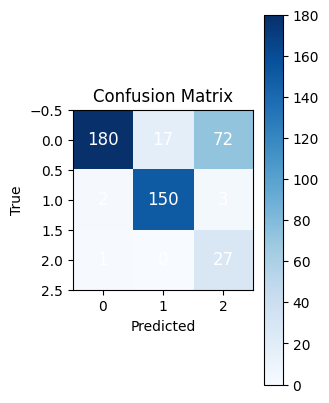

In [ ]:
# Confusion Matrix
cm = confusion_matrix(all_labels, all_predictions)



# Plot confusion matrix
plt.subplot(1, 2, 2)
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, str(cm[i, j]), ha='center', va='center', color='white', fontsize=12)

plt.title('Confusion Matrix')
plt.colorbar()
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


## RoBERTa

In [ ]:
roberta_tokenizer = AutoTokenizer.from_pretrained("roberta-base")

def tokenize_function_roberta(examples):
    return roberta_tokenizer(examples["sentence"], padding="max_length", truncation=True)

tokenized_datasets_roberta = dataset.map(tokenize_function_roberta, batched=True)

small_train_dataset_roberta = tokenized_datasets_roberta["train"].select(range(1812))
small_eval_dataset_roberta = tokenized_datasets_roberta["train"].select(range(1812, 2264))



config.json:   0%|          | 0.00/481 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

Map:   0%|          | 0/2264 [00:00<?, ? examples/s]

In [ ]:
roberta_model = AutoModelForSequenceClassification.from_pretrained("roberta-base", num_labels=3)



metric_roberta = evaluate.load("accuracy")

def compute_metrics_roberta(eval_pred):
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=-1)
    return metric_roberta.compute(predictions=predictions, references=labels)


training_args_roberta = TrainingArguments(output_dir="test_trainer2", evaluation_strategy="steps", eval_steps=500,num_train_epochs=3, )

trainer_roberta = Trainer(
    model=roberta_model,
    args=training_args_roberta,
    train_dataset=small_train_dataset_roberta,
    eval_dataset=small_eval_dataset_roberta,
    compute_metrics=compute_metrics_roberta,
)

trainer_roberta.train()
trainer_roberta.evaluate()


model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.out_proj.bias', 'classifier.dense.bias', 'classifier.out_proj.weight', 'classifier.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Step,Training Loss,Validation Loss,Accuracy
500,0.228800,0.463392,0.926991


{'eval_loss': 0.7897834181785583,
 'eval_accuracy': 0.8672566371681416,
 'eval_runtime': 13.0513,
 'eval_samples_per_second': 34.632,
 'eval_steps_per_second': 4.367,
 'epoch': 3.0}

In [ ]:
roberta_model.eval()
roberta_all_labels = []
roberta_all_predictions = []

with torch.no_grad():
    for roberta_example in small_eval_dataset_roberta:
        roberta_inputs = {
            "input_ids": torch.tensor([roberta_example["input_ids"]]).to('cuda'),
            "attention_mask": torch.tensor([roberta_example["attention_mask"]]).to('cuda')
        }
        roberta_labels = torch.tensor([roberta_example["label"]])

        roberta_outputs = roberta_model(**roberta_inputs)
        roberta_logits = roberta_outputs.logits
        roberta_predictions = torch.argmax(roberta_logits, dim=1).tolist()

        roberta_all_labels.extend(roberta_labels)
        roberta_all_predictions.extend(roberta_predictions)

# Convert lists to numpy arrays
roberta_all_labels = np.array(roberta_all_labels)
roberta_all_predictions = np.array(roberta_all_predictions)

# Calculate metrics
roberta_precision = precision_score(roberta_all_labels, roberta_all_predictions, average='weighted')
roberta_recall = recall_score(roberta_all_labels, roberta_all_predictions, average='weighted')
roberta_f1 = f1_score(roberta_all_labels, roberta_all_predictions, average='weighted')

# Print and plot metrics
print(f"Roberta Precision: {roberta_precision}")
print(f"Roberta Recall: {roberta_recall}")
print(f"Roberta F1 Score: {roberta_f1}")


Roberta Precision: 0.9277825878575288
Roberta Recall: 0.8672566371681416
Roberta F1 Score: 0.8816545850096987


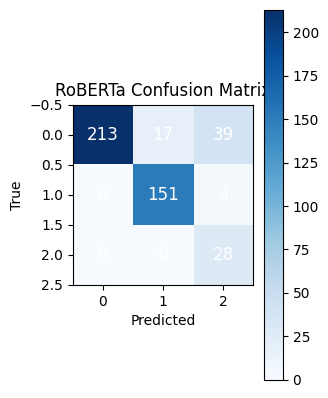

In [ ]:
# Confusion Matrix
roberta_cm = confusion_matrix(roberta_all_labels, roberta_all_predictions)

# Plot confusion matrix
plt.subplot(1, 2, 2)
plt.imshow(roberta_cm, interpolation='nearest', cmap=plt.cm.Blues)
for i in range(roberta_cm.shape[0]):
    for j in range(roberta_cm.shape[1]):
        plt.text(j, i, str(roberta_cm[i, j]), ha='center', va='center', color='white', fontsize=12)

plt.title('RoBERTa Confusion Matrix')
plt.colorbar()
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


## DistilRoBERTa

In [ ]:
droberta_tokenizer = AutoTokenizer.from_pretrained("mrm8488/distilroberta-finetuned-financial-news-sentiment-analysis")

def tokenize_function_droberta(examples):
    return droberta_tokenizer(examples["sentence"], padding="max_length", truncation=True)

tokenized_datasets_droberta = dataset.map(tokenize_function_droberta, batched=True)

small_train_dataset_droberta = tokenized_datasets_droberta["train"].select(range(1812))
small_eval_dataset_droberta = tokenized_datasets_droberta["train"].select(range(1812, 2264))

droberta_model = AutoModelForSequenceClassification.from_pretrained("mrm8488/distilroberta-finetuned-financial-news-sentiment-analysis", num_labels=3)



metric_droberta = evaluate.load("accuracy")

def compute_metrics_droberta(eval_pred):
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=-1)
    return metric_droberta.compute(predictions=predictions, references=labels)


training_args_droberta = TrainingArguments(output_dir="test_trainer3", evaluation_strategy="steps", eval_steps=500,num_train_epochs=3, )

trainer_droberta = Trainer(
    model=droberta_model,
    args=training_args_droberta,
    train_dataset=small_train_dataset_droberta,
    eval_dataset=small_eval_dataset_droberta,
    compute_metrics=compute_metrics_droberta,
)

trainer_droberta.train()
trainer_droberta.evaluate()

tokenizer_config.json:   0%|          | 0.00/333 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/798k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

Map:   0%|          | 0/2264 [00:00<?, ? examples/s]

config.json:   0%|          | 0.00/933 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/328M [00:00<?, ?B/s]

Step,Training Loss,Validation Loss,Accuracy
500,0.073100,0.606177,0.918142


{'eval_loss': 0.6264870166778564,
 'eval_accuracy': 0.9092920353982301,
 'eval_runtime': 6.673,
 'eval_samples_per_second': 67.735,
 'eval_steps_per_second': 8.542,
 'epoch': 3.0}

In [ ]:
droberta_model.eval()
droberta_all_labels = []
droberta_all_predictions = []

with torch.no_grad():
    for droberta_example in small_eval_dataset_droberta:
        droberta_inputs = {
            "input_ids": torch.tensor([droberta_example["input_ids"]]).to('cuda'),
            "attention_mask": torch.tensor([droberta_example["attention_mask"]]).to('cuda')
        }
        droberta_labels = torch.tensor([droberta_example["label"]])

        droberta_outputs = droberta_model(**droberta_inputs)
        droberta_logits = droberta_outputs.logits
        droberta_predictions = torch.argmax(droberta_logits, dim=1).tolist()

        droberta_all_labels.extend(droberta_labels)
        droberta_all_predictions.extend(droberta_predictions)

# Convert lists to numpy arrays
droberta_all_labels = np.array(droberta_all_labels)
droberta_all_predictions = np.array(droberta_all_predictions)

# Calculate metrics
droberta_precision = precision_score(droberta_all_labels, droberta_all_predictions, average='weighted')
droberta_recall = recall_score(droberta_all_labels, droberta_all_predictions, average='weighted')
droberta_f1 = f1_score(droberta_all_labels, droberta_all_predictions, average='weighted')

# Print and plot metrics
print(f"DistilRoBERTa Precision: {droberta_precision}")
print(f"DistilRoBERTa Recall: {droberta_recall}")
print(f"DistilRoBERTa F1 Score: {droberta_f1}")


DistilRoBERTa Precision: 0.9508364439883354
DistilRoBERTa Recall: 0.9092920353982301
DistilRoBERTa F1 Score: 0.9205944035666027


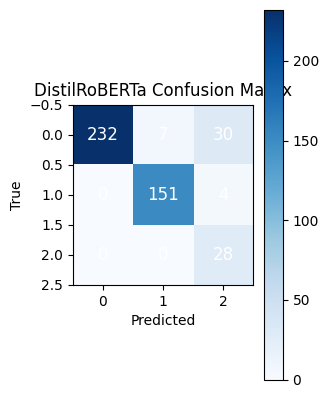

In [ ]:
# Confusion Matrix
droberta_cm = confusion_matrix(droberta_all_labels, droberta_all_predictions)

# Plot confusion matrix
plt.subplot(1, 2, 2)
plt.imshow(droberta_cm, interpolation='nearest', cmap=plt.cm.Blues)
for i in range(droberta_cm.shape[0]):
    for j in range(droberta_cm.shape[1]):
        plt.text(j, i, str(droberta_cm[i, j]), ha='center', va='center', color='white', fontsize=12)

plt.title('DistilRoBERTa Confusion Matrix')
plt.colorbar()
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


### FinBERT

In [ ]:
froberta_tokenizer = AutoTokenizer.from_pretrained("ProsusAI/finbert")

def tokenize_function_froberta(examples):
    return froberta_tokenizer(examples["sentence"], padding="max_length", truncation=True)

tokenized_datasets_froberta = dataset.map(tokenize_function_froberta, batched=True)

small_train_dataset_froberta = tokenized_datasets_froberta["train"].select(range(1812))
small_eval_dataset_froberta = tokenized_datasets_froberta["train"].select(range(1812, 2264))

froberta_model = AutoModelForSequenceClassification.from_pretrained("ProsusAI/finbert", num_labels=3)



metric_froberta = evaluate.load("accuracy")

def compute_metrics_froberta(eval_pred):
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=-1)
    return metric_froberta.compute(predictions=predictions, references=labels)


training_args_froberta = TrainingArguments(output_dir="test_trainer4", evaluation_strategy="steps", eval_steps=500,num_train_epochs=3, )

trainer_froberta = Trainer(
    model=froberta_model,
    args=training_args_froberta,
    train_dataset=small_train_dataset_froberta,
    eval_dataset=small_eval_dataset_froberta,
    compute_metrics=compute_metrics_froberta,
)

trainer_froberta.train()
trainer_froberta.evaluate()

tokenizer_config.json:   0%|          | 0.00/252 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/758 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

Map:   0%|          | 0/2264 [00:00<?, ? examples/s]

pytorch_model.bin:   0%|          | 0.00/438M [00:00<?, ?B/s]

Step,Training Loss,Validation Loss,Accuracy
500,0.154400,0.901378,0.849558


{'eval_loss': 1.0189001560211182,
 'eval_accuracy': 0.8407079646017699,
 'eval_runtime': 14.6872,
 'eval_samples_per_second': 30.775,
 'eval_steps_per_second': 3.881,
 'epoch': 3.0}

FinBERT Precision: 0.9306463350830777
FinBERT Recall: 0.8407079646017699
FinBERT F1 Score: 0.8638152085769436


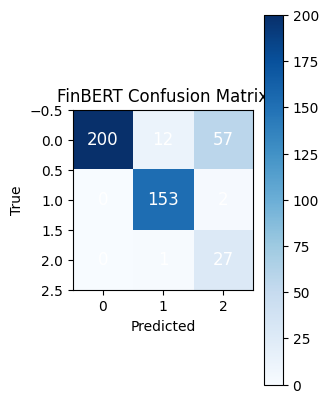

In [ ]:
froberta_model.eval()
froberta_all_labels = []
froberta_all_predictions = []

with torch.no_grad():
    for froberta_example in small_eval_dataset_froberta:
        froberta_inputs = {
            "input_ids": torch.tensor([froberta_example["input_ids"]]).to('cuda'),
            "attention_mask": torch.tensor([froberta_example["attention_mask"]]).to('cuda')
        }
        froberta_labels = torch.tensor([froberta_example["label"]])

        froberta_outputs = froberta_model(**froberta_inputs)
        froberta_logits = froberta_outputs.logits
        froberta_predictions = torch.argmax(froberta_logits, dim=1).tolist()

        froberta_all_labels.extend(froberta_labels)
        froberta_all_predictions.extend(froberta_predictions)

# Convert lists to numpy arrays
froberta_all_labels = np.array(froberta_all_labels)
froberta_all_predictions = np.array(froberta_all_predictions)

# Calculate metrics
froberta_precision = precision_score(froberta_all_labels, froberta_all_predictions, average='weighted')
froberta_recall = recall_score(froberta_all_labels, froberta_all_predictions, average='weighted')
froberta_f1 = f1_score(froberta_all_labels, froberta_all_predictions, average='weighted')

# Print and plot metrics
print(f"FinBERT Precision: {froberta_precision}")
print(f"FinBERT Recall: {froberta_recall}")
print(f"FinBERT F1 Score: {froberta_f1}")

# Confusion Matrix
froberta_cm = confusion_matrix(froberta_all_labels, froberta_all_predictions)

# Plot confusion matrix
plt.subplot(1, 2, 2)
plt.imshow(froberta_cm, interpolation='nearest', cmap=plt.cm.Blues)
for i in range(froberta_cm.shape[0]):
    for j in range(froberta_cm.shape[1]):
        plt.text(j, i, str(froberta_cm[i, j]), ha='center', va='center', color='white', fontsize=12)

plt.title('FinBERT Confusion Matrix')
plt.colorbar()
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


## Comparaison des méthodes
Passons maintenant à la comparaison des méthodes afin d'en choisir la meilleure pour l'éxpliquer et ensuite faire l'inférence et le déploiement

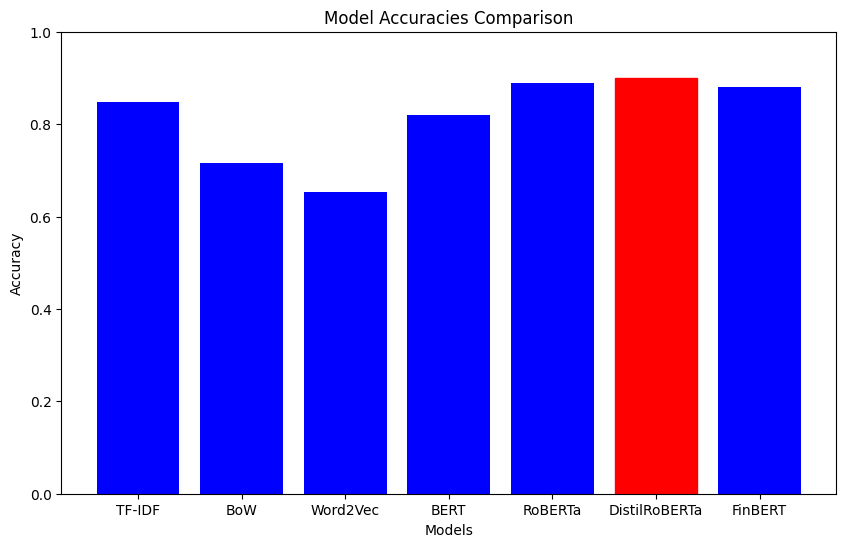

In [ ]:


# Your saved accuracies for the seven models
model_names = ["TF-IDF", "BoW", "Word2Vec", "BERT", "RoBERTa", "DistilRoBERTa", "FinBERT"]
accuracies = [acc_sgd, acc_sgd_bow, acc_sgd_wv, 0.82, 0.89, 0.90,  0.88]

# Find the index of the maximum accuracy
max_accuracy_index = accuracies.index(max(accuracies))

# Plotting the accuracies
plt.figure(figsize=(10, 6))
bars = plt.bar(model_names, accuracies, color='blue')

# Highlight the maximum accuracy in red
bars[max_accuracy_index].set_color('red')

plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Model Accuracies Comparison')
plt.ylim(0, 1)  # Set y-axis limit between 0 and 1 for accuracy values
plt.show()


Après avoir effectué la comparaison, il est évident que DistilRoBERTa a affiché les meilleures performances. Même en examinant sa matrice de confusion, il est notable que ce modèle a réussi à classifier la majorité des documents dans leurs classes respectives avec précision. Nous tenons à souligner aussi qu'il est le plus rapide entre les modèles Transformers en matière de temps d'entrainement

## Explainability

SHAP (SHapley Additive exPlanations) is a powerful technique for interpreting the output of machine learning models. When it comes to text transformers, SHAP can be used to understand the impact of each word/token on the model's predictions. The SHAP explainer for text transformers provides insights into how individual words contribute to the model's output.
We can clearly see that the DistilRoBERTa model is the best in terms of accuracy and even F1-Score. Therefore, we will continue the rest of the project using this model."

In [ ]:
def f(x):
    tv = torch.tensor(
        [
            droberta_tokenizer.encode(v, padding="max_length", max_length=128, truncation=True)
            for v in x
        ]
    ).cuda()
    attention_mask = (tv != 0).type(torch.int64).cuda()
    outputs = droberta_model(tv, attention_mask=attention_mask)[0].detach().cpu().numpy()
    scores = (np.exp(outputs).T / np.exp(outputs).sum(-1)).T
    val = sp.special.logit(scores)
    return val

In [ ]:
labels = sorted(droberta_model.config.label2id, key=droberta_model.config.label2id.get)

explainer = shap.Explainer(f, droberta_tokenizer, output_names=labels)

In [ ]:
labels

['negative', 'neutral', 'positive']

Nous entrainons notre modèle d'XAI que sur les 15 premiers textes

In [ ]:
shap_values = explainer(dataset['train']['sentence'][:15])

PartitionExplainer explainer: 16it [00:31,  2.64s/it]


In [ ]:
shap.plots.text(shap_values)

Nous pouvons clairement intérpreter ces résultats en fonction des schéma afficher par exemple pour le 4eme texte nous pouvons voir que le modèle l'a bien classifier (positive) et le token (mot) qui a contribué le plus à cette classification c'est INCREASED  chose qu'est logique pour nous les humains et donc nous pouvons voir l'utilité de l'XAI dans cet exemple ou on a pu comprendre sur quoi le modèle s'est basé pour prédire la classe

/usr/local/lib/python3.10/dist-packages/slicer/slicer_internal.py:443: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.

/usr/local/lib/python3.10/dist-packages/shap/_explanation.py:530: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



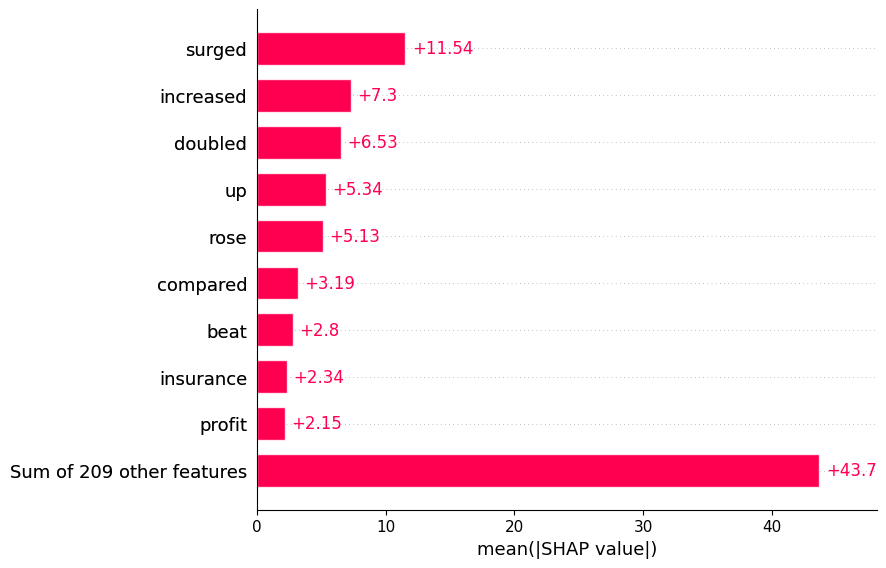

In [ ]:
shap.plots.bar(shap_values[:, :, "positive"])


Pour confirmer les résultats précedents nous avons afficher les mots (tokens) qui interviennent le plus pour la classifications des textes en "positive" et comme nous pouvons le voir les mots : increased,doubled,profit,surged etc. contribuent à classé les textes qui les contiennent en sentiment positive

## Model Inference
Passons maintenant à l'inference c'est à dire voir si le modèle va bien classer des nouveaux textes

In [ ]:
input_text = "Pharmaceutical group Orion Corp reported a decline in third-quarter earnings, attributed to increased expenditures on marketing activities."

# Tokenize and encode input text
inputs = droberta_tokenizer(input_text, return_tensors="pt", truncation=True)
inputs.to('cuda')
# Perform inference
with torch.no_grad():
    outputs = droberta_model(**inputs)

logits = outputs.logits

probabilities = torch.nn.functional.softmax(logits, dim=1)
predicted_class = torch.argmax(probabilities, dim=1).item()


In [ ]:
# Post-processing example
result = "Neutral" if predicted_class == 1 else ("Negative" if predicted_class == 0 else "Positive")



In [ ]:
result

'Negative'

dans l'exemple précedent nous avons donné comme entré au modèle un texte qui clairement est négatif concenrant le financial sentiment analysis, et le modèle a su le catégoriser comme négative, nous allons produire plusieurs autre texte qui ont des sentiments différents et on va essayer de les classifier aussi après avoir sauvegarder le modèle

## Saving the model

In [ ]:

# # Specify the directory where you want to save the model 
# save_directory_drive = './your_model_directory'

# # Save the tokenizer and the model to Google Drive
# droberta_tokenizer.save_pretrained(save_directory_drive)
# droberta_model.save_pretrained(save_directory_drive)


Mounted at /content/drive


In [ ]:


# Specify the directory path where you saved the model in Google Drive
load_directory_drive = './your_model_directory'

# Load the tokenizer and the model from Google Drive
loaded_tokenizer = AutoTokenizer.from_pretrained(load_directory_drive)
loaded_bert_model = AutoModelForSequenceClassification.from_pretrained(load_directory_drive)


Mounted at /content/drive


In [ ]:


# List of test sentences and their actual labels
test_data = [
    ("The company reported steady growth in revenue, meeting market expectations.", "Positive"),
    ("Despite economic challenges, the stock market showed resilience, remaining relatively stable.", "Neutral"),
    ("Investors expressed concern over the unexpected decline in quarterly profits.", "Negative"),
    ("The new product launch was met with enthusiasm, boosting investor confidence.", "Positive"),
    ("Market analysts predict a period of uncertainty due to global economic fluctuations.", "Neutral"),
    ("Shareholders celebrated as the company's stock reached an all-time high.", "Positive"),
    ("The announcement of layoffs led to a negative reaction from both employees and investors.", "Negative"),
    ("Economic indicators suggest a potential downturn in the coming months.", "Negative"),
    ("The acquisition of a rival company positioned us for strategic growth opportunities.", "Positive"),
    ("Concerns about inflation rates sparked a sell-off in the stock market.", "Negative")
]

# Loop through test data
for input_text, actual_class in test_data:
    # Tokenize and encode input text
    inputs = loaded_tokenizer(input_text, return_tensors="pt", truncation=True)

    # Perform inference
    with torch.no_grad():
        outputs = loaded_bert_model(**inputs)

    logits = outputs.logits

    probabilities = torch.nn.functional.softmax(logits, dim=1)
    predicted_class = torch.argmax(probabilities, dim=1).item()

    # Post-processing
    predicted_class_label = "Neutral" if predicted_class == 1 else ("Negative" if predicted_class == 0 else "Positive")

    # Print the result for each sentence
    print(f"Actual Class: {actual_class}, Predicted Class: {predicted_class_label}, Text: '{input_text}'")


Actual Class: Positive, Predicted Class: Positive, Text: 'The company reported steady growth in revenue, meeting market expectations.'
Actual Class: Neutral, Predicted Class: Positive, Text: 'Despite economic challenges, the stock market showed resilience, remaining relatively stable.'
Actual Class: Negative, Predicted Class: Negative, Text: 'Investors expressed concern over the unexpected decline in quarterly profits.'
Actual Class: Positive, Predicted Class: Positive, Text: 'The new product launch was met with enthusiasm, boosting investor confidence.'
Actual Class: Neutral, Predicted Class: Neutral, Text: 'Market analysts predict a period of uncertainty due to global economic fluctuations.'
Actual Class: Positive, Predicted Class: Positive, Text: 'Shareholders celebrated as the company's stock reached an all-time high.'
Actual Class: Negative, Predicted Class: Negative, Text: 'The announcement of layoffs led to a negative reaction from both employees and investors.'
Actual Class: Ne

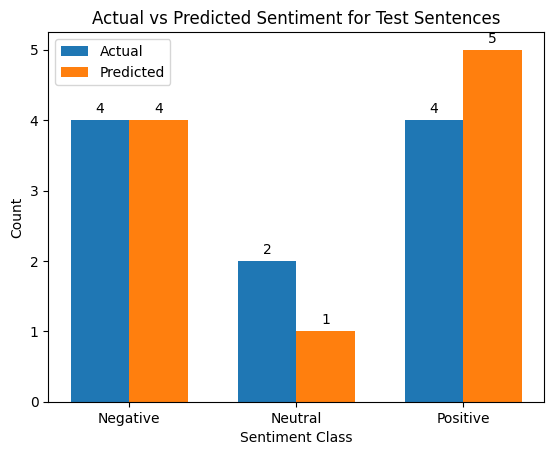

In [ ]:


# List of test sentences and their actual labels
test_data = [
    ("The company reported steady growth in revenue, meeting market expectations.", "Positive"),
    ("Despite economic challenges, the stock market showed resilience, remaining relatively stable.", "Neutral"),
    ("Investors expressed concern over the unexpected decline in quarterly profits.", "Negative"),
    ("The new product launch was met with enthusiasm, boosting investor confidence.", "Positive"),
    ("Market analysts predict a period of uncertainty due to global economic fluctuations.", "Neutral"),
    ("Shareholders celebrated as the company's stock reached an all-time high.", "Positive"),
    ("The announcement of layoffs led to a negative reaction from both employees and investors.", "Negative"),
    ("Economic indicators suggest a potential downturn in the coming months.", "Negative"),
    ("The acquisition of a rival company positioned us for strategic growth opportunities.", "Positive"),
    ("Concerns about inflation rates sparked a sell-off in the stock market.", "Negative")
]

# Initialize lists to store actual and predicted labels
actual_labels = []
predicted_labels = []

# Loop through test data
for input_text, actual_class in test_data:
    # Tokenize and encode input text
    inputs = loaded_tokenizer(input_text, return_tensors="pt", truncation=True)

    # Perform inference
    with torch.no_grad():
        outputs = loaded_bert_model(**inputs)

    logits = outputs.logits

    probabilities = torch.nn.functional.softmax(logits, dim=1)
    predicted_class = torch.argmax(probabilities, dim=1).item()

    # Post-processing
    predicted_class_label = "Neutral" if predicted_class == 1 else ("Negative" if predicted_class == 0 else "Positive")

    # Append actual and predicted labels to lists
    actual_labels.append(actual_class)
    predicted_labels.append(predicted_class_label)

# Plot the bar chart
labels = np.unique(actual_labels + predicted_labels)
actual_counts = [actual_labels.count(label) for label in labels]
predicted_counts = [predicted_labels.count(label) for label in labels]

width = 0.35
x = np.arange(len(labels))

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, actual_counts, width, label='Actual')
rects2 = ax.bar(x + width/2, predicted_counts, width, label='Predicted')

ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

# Labeling
ax.bar_label(rects1, padding=3)
ax.bar_label(rects2, padding=3)

plt.xlabel('Sentiment Class')
plt.ylabel('Count')
plt.title('Actual vs Predicted Sentiment for Test Sentences')
plt.show()



À la lumière de cette expérience, il est observable que le modèle a correctement prédit toutes les phrases ayant un sentiment négatif. Cependant, une seule phrase a été incorrectement classée dans les catégories positives et neutres. Cette erreur peut être attribuée à la complexité et à l'ambiguïté de la phrase par rapport à celles déjà rencontrées lors de l'entraînement et de la validation. De plus, cela pourrait être influencé par le déséquilibre des classes dans le jeu de données.
Le modèle est donc pret au déploiement en API, pour cela nous avons décidé d'utiliser FAST API.